In [88]:
# levanta los plogonos de hisup y los georeferencia
import numpy as np
import rasterio
from rasterio.features import shapes
import shapely
from shapely.geometry import Polygon, mapping, shape, MultiPolygon
import fiona
from fiona.crs import from_epsg
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from rasterio.plot import show, show_hist
import pandas as pd
import geopandas as gpd
import glob
import warnings
import pickle
import affine
from affine import Affine
import os
from pyproj import CRS

In [89]:
# Guardar una lista de cadenas en un archivo de texto
def guardar_lista_en_archivo(lista, nombre_archivo):
    with open(nombre_archivo, 'w') as archivo:
        for elemento in lista:
            archivo.write(elemento + '\n')

# Leer una lista de cadenas desde un archivo de texto
def leer_lista_desde_archivo(nombre_archivo):
    lista = []
    with open(nombre_archivo, 'r') as archivo:
        for linea in archivo:
            lista.append(linea.strip())  # Eliminar el salto de línea
    return lista

In [90]:
#carpeta de datos
datapath= "./data/"

In [91]:
# Obtener la lista de nombres de archivos que coinciden con el patrón
# Obtener la lista de archivos de cada carpeta
archivos_hisup = sorted([f for f in os.listdir(datapath+'hisup_data/') if f.endswith(".shp")])
archivos_gt = sorted([f for f in os.listdir(datapath+'gt/') if f.endswith(".pkl")])

# las dos listas estan indexadas de tal forma que corresponden a la info de la misma foto
hisup_list = []
gt_list = []

for archivo1, archivo2 in zip(archivos_hisup, archivos_gt):
    ruta_archivo1 = os.path.join(datapath+'hisup_data/', archivo1)
    ruta_archivo2 = os.path.join(datapath+'gt/', archivo2)
    
    gdf_hisup = gpd.read_file(ruta_archivo1)
    # elimino los multipoligonos
    gdf_hisup = gdf_hisup.explode(index_parts = True)
    with open(ruta_archivo2,'rb') as archivo:
        gt = pickle.load(archivo)
    
    hisup_list.append(gdf_hisup)
    gt_list.append(gt)

In [92]:
# Matriz affine a partir de la gt del tif
# input src.transform de un tif
def gt_aff(gt):
    affine_seis_elementos = [gt.a, gt.b, gt.d,gt.e, gt.c, gt.f]
    return affine_seis_elementos

In [93]:
# geotrasnformo los poligonos de hisup
# leer el crs de alguna foto o ponerlo a mano
crs = CRS.from_epsg(3857)

gdf_hisuptr_list = []

for i in range(len(hisup_list)):
    gdf_hisuptr = hisup_list[i].copy()  
    gdf_hisuptr.geometry = hisup_list[i].geometry.affine_transform(gt_aff(gt_list[i]))
    gdf_hisuptr_list.append(gdf_hisuptr)
    # Establecer el CRS del GeoDataFrame
    gdf_hisuptr_list[i].crs = crs

In [94]:
# guardar los poligonos geotransformados

# Guardar los geopandas con el siguiente formato "gpd_+nombre del tif"
# Ruta completa de la carpeta que se creará
ruta_completa = os.path.join(datapath, 'hisup_tr/')

# Crear la carpeta en el directorio especificado
os.makedirs(ruta_completa, exist_ok=True)

# algunos hisup pueden ser vacios asi que me guardo el nombre de los vacios
empty = [] 
for geopandas_obj, nombre_archivo in zip(gdf_hisuptr_list,archivos_hisup):
    # Guardar el GeoPandas en formato shapefile
    if not geopandas_obj.empty:
        geopandas_obj.to_file(ruta_completa+"gdfhisup_"+ nombre_archivo)
    # guardo los nombres de los poligonos vacios
    else:
        name = nombre_archivo.split('.shp')[0]
        empty.append(name+'.tif')  

# guardo los nombres de los poligonos vacios de hisup
guardar_lista_en_archivo(empty,ruta_completa+'empty.txt') 

In [95]:
# leo los geopandas trasnformados
# Ruta completa de la carpeta que se creará
ruta_completa = os.path.join(datapath, 'hisup_tr/')
archivos_hisup = sorted([f for f in os.listdir(ruta_completa) if f.endswith(".shp")])

# las dos listas estan indexadas de tal forma que corresponden a la info de la misma foto
hisup_list = []

for archivo  in archivos_hisup:
    ruta_archivo = os.path.join(ruta_completa, archivo)

    gdf_hisup = gpd.read_file(ruta_archivo)
    hisup_list.append(gdf_hisup)

In [96]:
print(len(archivos_hisup))

28


In [97]:
#leo los tifs salvo los que tienen poligono de hisup vacio
empty = leer_lista_desde_archivo(ruta_completa+'empty.txt')
ortho_files= sorted([f for f in os.listdir(datapath+'recorte_B2124/') if f.endswith(".tif")])
set1 = set(ortho_files)
set2= set(empty)
dif = sorted(set1 - set2)
ortho_files = list(dif)    

In [98]:
print(ortho_files)
print(archivos_hisup)

['B2124_rec_0_0.tif', 'B2124_rec_0_1.tif', 'B2124_rec_0_2.tif', 'B2124_rec_0_3.tif', 'B2124_rec_0_4.tif', 'B2124_rec_0_5.tif', 'B2124_rec_1_0.tif', 'B2124_rec_1_1.tif', 'B2124_rec_1_2.tif', 'B2124_rec_1_3.tif', 'B2124_rec_1_4.tif', 'B2124_rec_1_5.tif', 'B2124_rec_2_0.tif', 'B2124_rec_2_1.tif', 'B2124_rec_2_3.tif', 'B2124_rec_2_4.tif', 'B2124_rec_2_5.tif', 'B2124_rec_3_0.tif', 'B2124_rec_3_1.tif', 'B2124_rec_3_2.tif', 'B2124_rec_3_3.tif', 'B2124_rec_3_4.tif', 'B2124_rec_3_5.tif', 'B2124_rec_4_1.tif', 'B2124_rec_4_2.tif', 'B2124_rec_4_3.tif', 'B2124_rec_4_4.tif', 'B2124_rec_4_5.tif']
['gdfhisup_B2124_rec_0_0.shp', 'gdfhisup_B2124_rec_0_1.shp', 'gdfhisup_B2124_rec_0_2.shp', 'gdfhisup_B2124_rec_0_3.shp', 'gdfhisup_B2124_rec_0_4.shp', 'gdfhisup_B2124_rec_0_5.shp', 'gdfhisup_B2124_rec_1_0.shp', 'gdfhisup_B2124_rec_1_1.shp', 'gdfhisup_B2124_rec_1_2.shp', 'gdfhisup_B2124_rec_1_3.shp', 'gdfhisup_B2124_rec_1_4.shp', 'gdfhisup_B2124_rec_1_5.shp', 'gdfhisup_B2124_rec_2_0.shp', 'gdfhisup_B2124_rec_

/tmp/ipykernel_4209/394791682.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(10, 10))


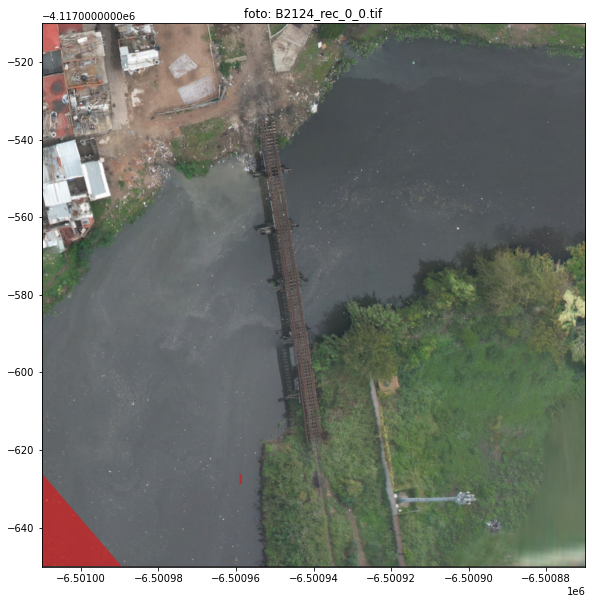

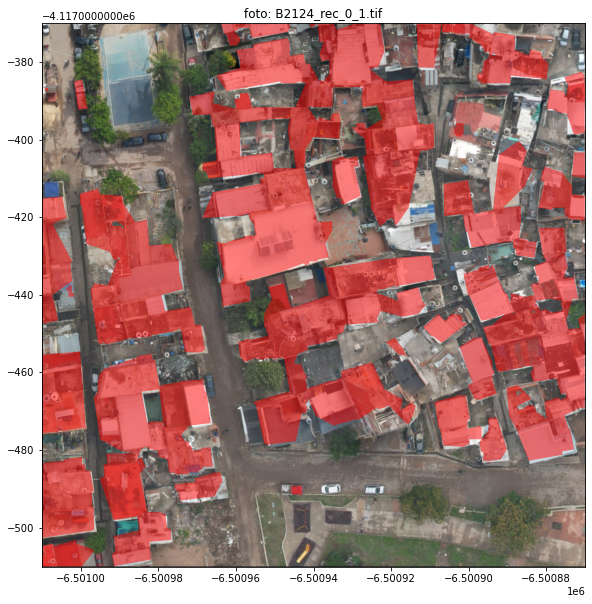

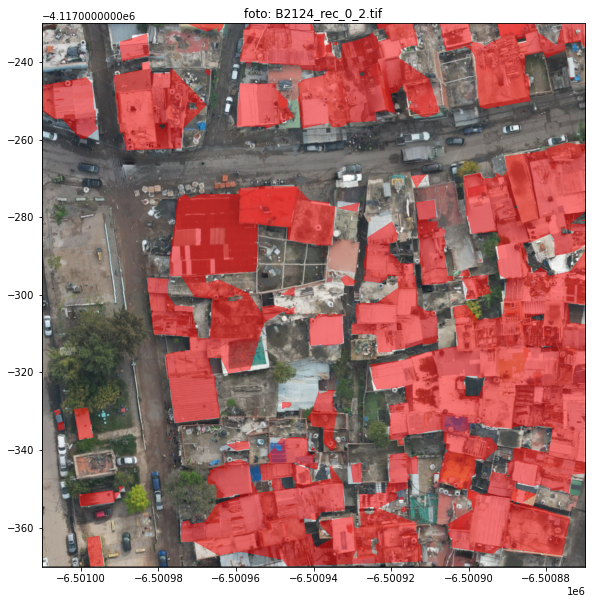

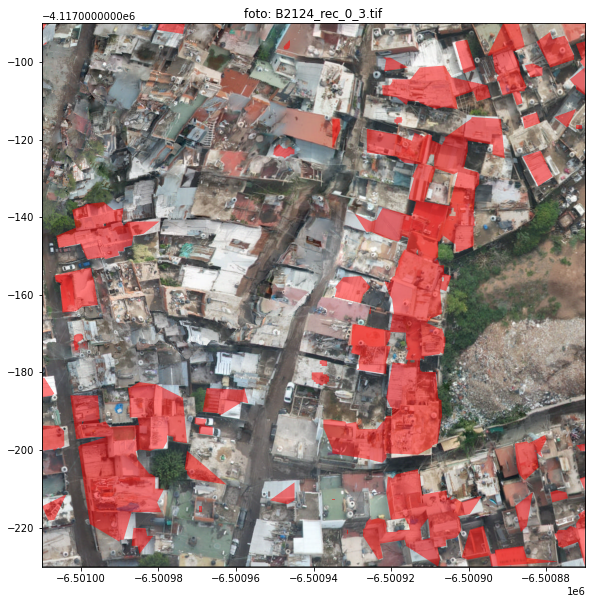

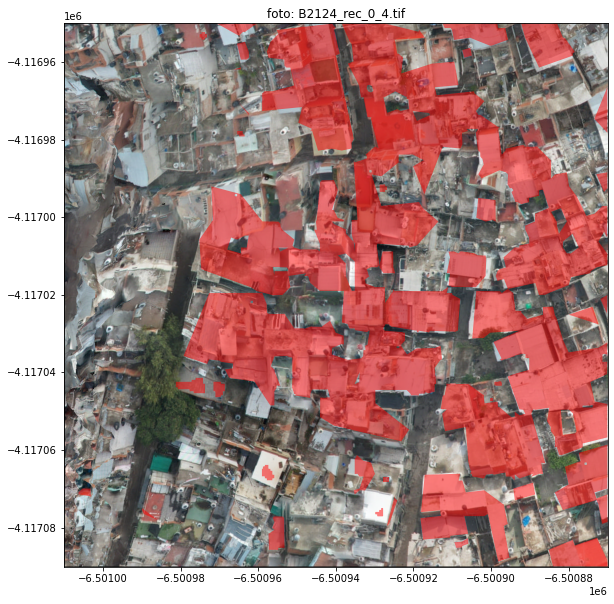

...

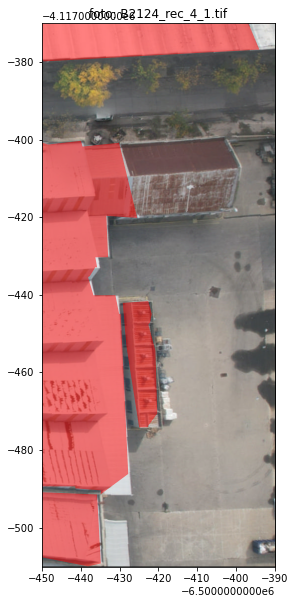

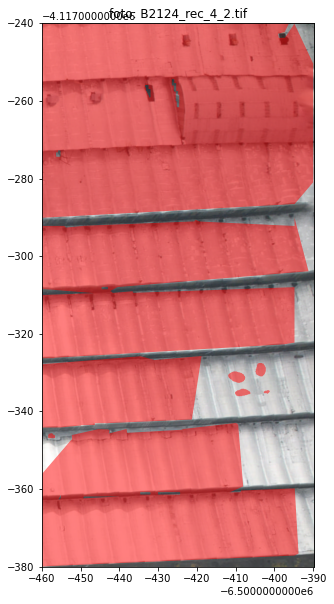

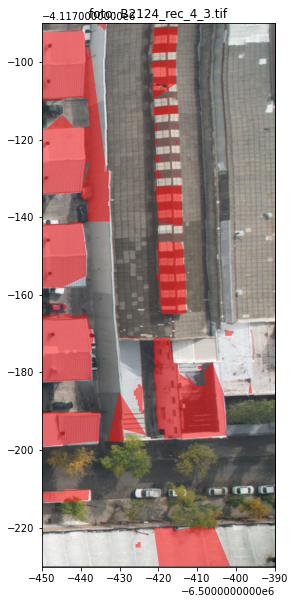

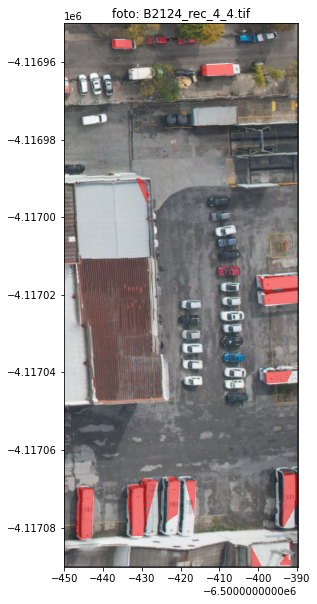

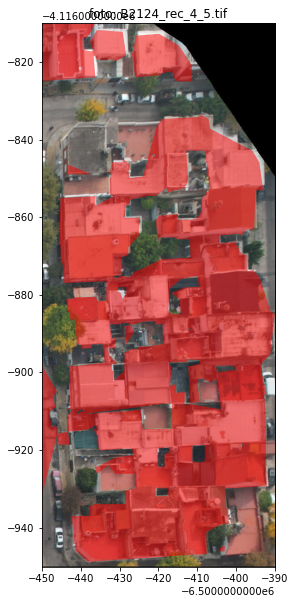

In [99]:
#dibujo los poligonso con la foto

for n in range(len(ortho_files)): 
    ortho = rasterio.open(datapath+'hisup_data/'+ortho_files[n])

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_title('foto: '+ortho_files[n])

    # Muestra el GeoTIFF en el eje
    show(ortho, ax=ax)

    # Muestra el GeoDataFrame en el eje
    hisup_list[n].plot(ax=ax, color='red',alpha=0.5)
